In [96]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
from sklearn.model_selection import GridSearchCV
import pydotplus
import matplotlib.pyplot as plt
from IPython.display import Image
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier

In [97]:
#organise and shape the testing and training datasets

trainset = pd.read_csv("creditdefault_train.csv")
testset = pd.read_csv("creditdefault_test.csv")

x_test = testset.drop("Y", axis = 1)
y_test = testset["Y"]

x_train = trainset.drop("Y",axis = 1)
y_train = trainset["Y"]

In [98]:
#Normalisation of the data set.
scaler = StandardScaler()
scaler.fit(x_train)
norm_Xtrain = scaler.transform(x_train)
norm_Xtest = scaler.transform(x_test)

--------------------------------------------------KNN-------------------------------------------------------------

I will be using KNN algorithm to train and test my model. This model required some data manipulation. Due to classes having different weights, a standardised data set had to be calculated in order to allow the distance calculations to function properly.

In [4]:
#nearest neighbour algorithm
neigh = []
acc = []

for i in range(1,30):
    #will use cross validation score to test our model on unseen data, while manipulating the nearest neighbour
    # ranges 1-30
    knn = KNeighborsClassifier(n_neighbors=i)
    S = cross_val_score(knn, norm_Xtrain, y_train, cv = 5, scoring = "accuracy",n_jobs = 16)
    neigh.append(i)
    acc.append(S.mean())
print(list(zip(neigh,acc)))

[(1, 0.725), (2, 0.7823333333333333), (3, 0.7729999999999999), (4, 0.7942000000000001), (5, 0.7921333333333334), (6, 0.8001999999999999), (7, 0.7998), (8, 0.8043333333333333), (9, 0.8038000000000001), (10, 0.8060666666666666), (11, 0.8062666666666667), (12, 0.8079333333333334), (13, 0.8082), (14, 0.8080666666666667), (15, 0.8089999999999999), (16, 0.8082666666666667), (17, 0.8084666666666667), (18, 0.8082666666666667), (19, 0.8092), (20, 0.8083333333333332), (21, 0.8095333333333332), (22, 0.8089999999999999), (23, 0.8096666666666668), (24, 0.8095333333333334), (25, 0.8095333333333332), (26, 0.8090666666666667), (27, 0.8091333333333335), (28, 0.8088666666666666), (29, 0.8092666666666666)]


Text(0, 0.5, 'acc')

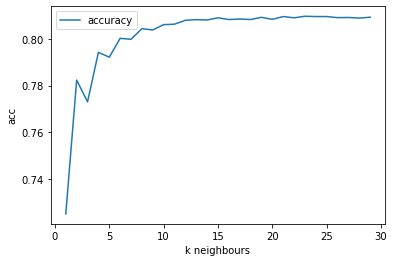

In [5]:
plt.plot(range(1,30),acc)
plt.legend(['accuracy'])
plt.xlabel("k neighbours")
plt.ylabel("acc")

We can see that as k increases (neighbours), the accuracy of the model increases and begins to plateu after k =10
From the charts we can see that k neighbours 20+ has the highest accuracy. This is high and could result
in biased results, a low k value will also cause problems in my results as it may lead to unstable decision boundaries and may miss out on better decisions being made if the k neighbours was increased. The higher the k value, the more complex and computationally expensive it may be. The whole idea of your nearest "neighbours" being similar is defeated with a very large range of data being checked for similarities.


In [6]:
knn = KNeighborsClassifier(n_neighbors=9)
predictions = knn.fit(norm_Xtrain, y_train)

In [7]:
knn.score(norm_Xtest, y_test)

0.8081333333333334

as predicted with the k neighbour acc test, the model with k = 9 performs better with the test data.
I believe that k range 6-9 is an acceptable range for an appropriate model.

--------------------------------------------DECISION TREE----------------------------------------------------------

The second algorithm I will be using is the Decision tree algorithm. This algorithm doesnt require a normalised dataset and functions fine with different class weights. The algorithm starts with root node and splits into branches of decison nodes in order to finalise outcomes.

In [15]:
#Decision tree with no set hyperparameters. Only default hyperparameters.
tree1 = tree.DecisionTreeClassifier()
tree1 = tree1.fit(x_train,y_train)

In [16]:
data = tree.export_graphviz(tree1, feature_names = x_train.columns, class_names=['1','0'],
                            filled = True, out_file = None)
graph1 = pydotplus.graph_from_dot_data(data)
Image(graph1.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.41776 to fit



In [43]:
treePred = tree1.predict(x_test)

In [44]:
print('Accuracy on test data is %.4f' % (accuracy_score(y_test,treePred)))
#result of this test data is  72.78%. This is wihtout any hyperparemeter tuning.
#Baseline model.

Accuracy on test data is 0.7278


In [33]:
#will run the Decision tree with hyperparameter CV tuning max depth up to 30
maxDepth = []
treeAcc = []

for depth in range(2,30):
    #we are using cross validation again to test our model on unseen data to work out the best possible outcome
    # in regards to manipulating the hyperparameter max_depth
    tree2 = tree.DecisionTreeClassifier(criterion= 'entropy', max_depth = depth)
    treeScores = cross_val_score(estimator= tree2, X=x_train,y= y_train,cv=10,
                                 scoring='accuracy', n_jobs=16)
    maxDepth.append(depth)
    treeAcc.append(treeScores.mean())

Text(0, 0.5, 'accuracy')

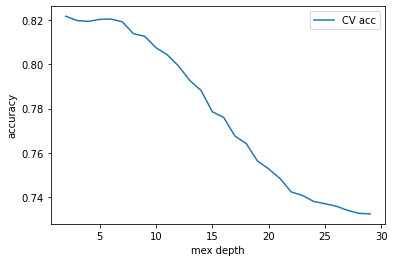

In [24]:
plt.plot(maxDepth, treeAcc)
plt.legend(['CV acc'])
plt.xlabel('mex depth')
plt.ylabel('accuracy')

Max depth tuning controls the depth of the tree that the algorithm creates. The accuracy decreases steadily after around max_depth=10 up to around max_depth=24.
From the cv accuracy, we can see that the optimum max_depth lies between max_depth=1 and max_depth=8.
The accuracy with the CV lies best around at 0.78 - 0.83. I believe this is a strong and farily accurate result 
From the chart above, we can assume that as we increase the depth of the tree, the accuracy decreases.

In [37]:
tree3 = tree.DecisionTreeClassifier(criterion= 'entropy', max_depth = 6)
tree3 = tree3.fit(x_train,y_train)

In [40]:
treePrediction = tree3.predict(x_test)
print('\n accuracy', accuracy_score(y_test, treePrediction))


 accuracy 0.8159333333333333


After tuning the max depth, we have achieved an accuracy of 0.815.

-------------------------------------------RANDOM FOREST-----------------------------------------------------------

The third model we will be tuning and using is Random Forest. This model is similar to decision tree, but is considered a strong algorithm for large datatsets and resolves missing values.

In [45]:
#no hyperparameter model.
forest = RandomForestClassifier()
forest.fit(x_train,y_train)

RandomForestClassifier()

In [46]:
forest.score(x_test,y_test)

0.8124

One of the most important hyperparameters that we can tune for the Random Forest is the number of decision trees in the forest, considered as n_estimators in Scikit-learn. Another that can impact the model outcome is criteria of the nodes (gini or entropy as it is a classification task).
I will be checking changes in n_estimators.

In [47]:

#using grid search cross validation
param_grid = [
     {'n_estimators': [2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16]} ]

grid_search = GridSearchCV(forest, param_grid, cv=5,
                           scoring='accuracy',
                           return_train_score=True)

grid_search.fit(x_train, y_train)
print('best parameter values', grid_search.best_params_)
print('best estimator', grid_search.best_estimator_)

best parameter values {'n_estimators': 14}
best estimator RandomForestClassifier(n_estimators=14)


In [48]:
best_forest=grid_search.best_estimator_
forestPrediction=best_forest.predict(x_test)

print('\n accuracy', accuracy_score(y_test, forestPrediction))



 accuracy 0.8078


After tuning hyperparameters, we have achieved a worse result while using grid search CV. This loops through predefined hyperparameters which in our case was number of estimators from 2-16 and provided the best results.
although the accuracy change was not largesst, it is still alarming that we achieved a lower score while having tuned the n_estimators to its optimal value using grid search.

-----------------------------------------Opinionated Best Model--------------------------------------------------

Looking back at the algorithms I have tuned, I believe that Decision Tree is the best algorithm for the dataset:

1. It was a fast and an efficient algorithm to tune, this was an important factor as many algorithms may take a large time frame to finish the model.
2. The model provided strong results after CV tuning. Acc score of 0.72 with no hyperparameters resulted in a score of 0.815. A large difference after hyperparameter tuning. This was refreshing compared to Random Forest where the model was decreasing in accuracy post tuning with grid search.

In [73]:
finalTree = tree.DecisionTreeClassifier(criterion= 'entropy', max_depth = 3)
finalTree= finalTree.fit(x_train,y_train)

In [74]:
finalTreePrediction = finalTree.predict(x_test)
print('\n accuracy', accuracy_score(y_test, finalTreePrediction))


 accuracy 0.8196666666666667


This is the best model I have achieved (0.82) with one hyperparameter being changed ( max_depth), As concluded earlier in the Decision tree section, the best range of max depth was 2-10.

I believe this is a good result to have achieved with only one paramter update. However, I believe that there is oppertunity for more accurate results by changing more hyperparameters.

In [75]:
from sklearn.metrics import confusion_matrix

In [77]:
confusion_matrix(y_test,finalTreePrediction)

array([[11068,   614],
       [ 2091,  1227]])

from the Confusion matrix, we can see that there is an increased number of false positives.

In [99]:
print(classification_report(y_test,finalTreePrediction))

              precision    recall  f1-score   support

           0       0.84      0.95      0.89     11682
           1       0.67      0.37      0.48      3318

    accuracy                           0.82     15000
   macro avg       0.75      0.66      0.68     15000
weighted avg       0.80      0.82      0.80     15000



According to the classification report, the recall shows the number of correctly predicted cases to be positive(1), this score was 0.37 which is a fairly bad score. The precision score being 0.67 is a good result but can be inmproved.
the F score (or harmonic mean) is the overall measure of a models accuracy. The score for positives (0.48) indicates that there is a problem with false positives. This could be an indication that there is a problem with the dataset. 


In [100]:
trainset.Y.value_counts()

0    11682
1     3318
Name: Y, dtype: int64

as we can see, there is a clear imbalance of the labels in the training dataset. This is important as it can train an algorithm to be "trigger happy" with a certain outcome. In this case, our algorithm might be trained to over compensate on the negative values and assume there are more negatives than there are when testing for positive values. The model underperforms when it comes to tackling false positives.

One method to tackle this problem would be to stratify our sample data. This would balance out the dataset so it would provide a better insight as to the algorithms performance.
Overall, I believe that the best model was Deicison Tree with the hyperparameter max_depth tuned to 3.